#Instalação de pacotes necessários

In [ ]:
!pip install efficientnet_pytorch
!pip install transformers
!pip install pytorch-lightning
!pip install sacrebleu
!pip install sentencepiece
!pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=7c32374e8832090fbc4536c0cfe860e06c282c6e46c8da00591547c3432c67ba
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
Successfully built efficientnet-pytorch
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.4 MB 5.3 MB/s 
     |████████████████████████████████| 101 kB 9.9 MB/s 
     |████████████████████████████████| 6.6 MB 14.0 MB/s 
     |████████████████████████████████| 596 kB 39.1 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

#Import das bibliotecas

In [ ]:
# Importar todos os pacotes de uma só vez para evitar duplicados ao longo do notebook.
import gzip
import os
import pytorch_lightning as pl
import random
import sacrebleu
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import pandas as pd
import numpy as np
import json
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')
from nltk.translate.meteor_score import meteor_score
from nltk import word_tokenize

from google.colab import drive

from pytorch_lightning.callbacks import ModelCheckpoint

from efficientnet_pytorch import EfficientNet

from transformers import T5ForConditionalGeneration
from transformers import T5Tokenizer
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

from matplotlib import pyplot as plt
import h5py
from PIL import Image
from tqdm import tqdm
import collections
from collections import OrderedDict


device = 'cuda' if torch.cuda.is_available() else 'cpu'

os.cpu_count(), torch.cuda.get_device_name() if device == "cuda" else None

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


(2, None)

In [ ]:
# import shutil

# shutil.rmtree('/content/train2017')

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


#Dataset MSCOCO

## Teste MS COCO completo

In [ ]:
import tensorflow as tf

# Download caption annotation files
annotation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.') + annotation_folder):
  annotation_zip = tf.keras.utils.get_file('captions.zip',
                                           cache_subdir=os.path.abspath('.'),
                                           origin='http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
                                           extract=True)
  annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
  os.remove(annotation_zip)

# Download image files
image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('train2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin='http://images.cocodataset.org/zips/train2014.zip',
                                      extract=True)
  PATH = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  PATH = os.path.abspath('.') + image_folder

13510582272/13510573713 [==============================] - 305s 0us/step


In [ ]:
len(os.listdir('train2014'))

82783

In [ ]:
# annotation_file = '/content/annotations/captions_train2014.json'

In [ ]:
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

In [ ]:
train_label = []
images_paths = os.listdir('/content/train2014')
f = h5py.File('TRAIN_IMAGES_coco_5_cap_per_img.hdf5', 'a')
for i in tqdm(range(len(images_paths))):
# for i in tqdm(range(5000)):
  img_first = np.array(Image.open('/content/train2014/' + images_paths[i]).resize((256,256)))
  if img_first.shape != (256, 256, 3):
    pass
  else:
    img = img_first[:,:,:3].reshape(1, 3, 256, 256)

  if i == 0:
    # Create the dataset at first
    f.create_dataset('images', data=img, compression="gzip", chunks=True, maxshape=(None,3,256,256)) 
  else:
    # Append new data to it
    f['images'].resize((f['images'].shape[0] + img.shape[0]), axis=0)
    f['images'][-img.shape[0]:] = img

  # Unomment this to create the list of captions
  photo_id = int(images_paths[i].split('_')[-1].split('.')[0])
  photo_label = []
  for cap in annotations['annotations']:
    if cap['image_id'] == photo_id:
      photo_label.append(cap['caption'])
  train_label.append(photo_label)

f.close()

  2%|▏         | 1579/82783 [01:47<1:32:03, 14.70it/s]


KeyboardInterrupt: ignored

In [ ]:
len(train_label)

In [ ]:
import json

with open('TRAIN_CAPTIONS_coco_5_cap_per_img.json', 'w') as outfile:
    outfile.write(json.dumps(train_label))

## Versão reduzida

In [ ]:
!wget https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TEST_CAPTIONS_coco_5_cap_per_img.json
!wget https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TEST_IMAGES_coco_5_cap_per_img.hdf5
!wget https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/VAL_CAPTIONS_coco_5_cap_per_img.json
!wget https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/VAL_IMAGES_coco_5_cap_per_img.hdf5
!wget https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TRAIN_CAPTIONS_coco_5_cap_per_img.json
!wget https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TRAIN_IMAGES_coco_5_cap_per_img.hdf5

--2022-07-21 03:53:16--  https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TEST_CAPTIONS_coco_5_cap_per_img.json
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.97.128, 142.251.107.128, 74.125.196.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.97.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 289777 (283K) [application/json]
Saving to: ‘TEST_CAPTIONS_coco_5_cap_per_img.json’

TEST_CAPTIONS_coco_ 100%[===================>] 282.99K  --.-KB/s    in 0.002s  

2022-07-21 03:53:16 (111 MB/s) - ‘TEST_CAPTIONS_coco_5_cap_per_img.json’ saved [289777/289777]

--2022-07-21 03:53:16--  https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TEST_IMAGES_coco_5_cap_per_img.hdf5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.107.128, 74.125.196.128, 74.125.31.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.107.128|:443... connected.
HTTP request 

In [ ]:
imgs = h5py.File('/content/TRAIN_IMAGES_coco_5_cap_per_img.hdf5', 'r')
# imgs = h5py.File('/content/drive/MyDrive/Deep Learning/Image_captioning/TRAIN_IMAGES_coco_5_cap_per_img.hdf5', 'r')
imgs.keys()

<KeysViewHDF5 ['images']>

###Mostrando alguns exemplos

In [ ]:
with open('/content/TRAIN_CAPTIONS_coco_5_cap_per_img.json') as json_file:
  # with open('/content/TRAIN_CAPTIONS_coco_5_cap_per_img.json') as json_file:
  captions = json.load(json_file)

In [ ]:
captions[7]

['An airplane flies over a street with many cars.',
 'An airplane comes in to land over a road full of cars',
 'A large jetliner flying over a traffic filled street.',
 'An airplane flies low in the sky over a city street. ',
 'The plane is flying over top of the cars']

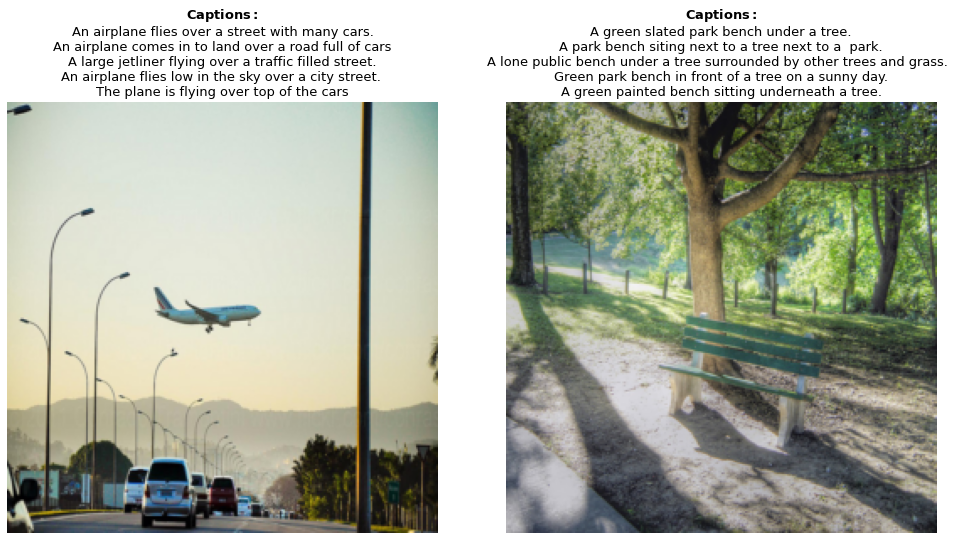

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14,8))
ax[0].imshow(imgs['images'][7].transpose(1,2,0))
ax[0].axis('off')
ax[0].set_title(r'$\bf{Captions:}$''\n' + f'\n'.join(captions[7]), fontsize = 13)

ax[1].imshow(imgs['images'][23].transpose(1,2,0))
ax[1].axis('off')
ax[1].set_title(r'$\bf{Captions:}$''\n' + f'\n'.join(captions[23]), fontsize = 13)
plt.tight_layout()
plt.savefig('Examples_train.png', dpi = 300, bbox_inches = 'tight')
plt.show()

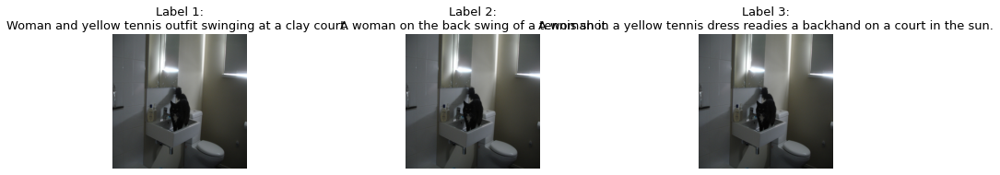

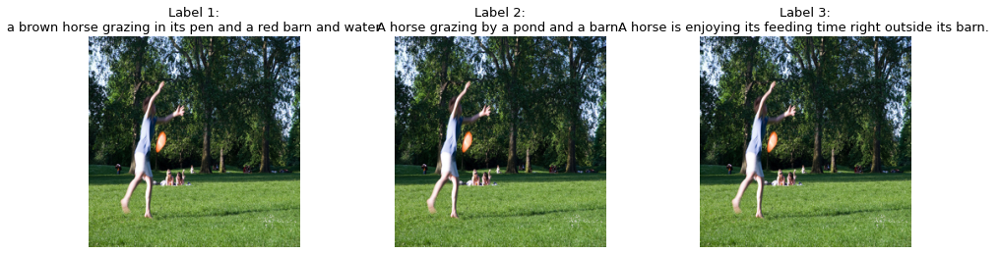

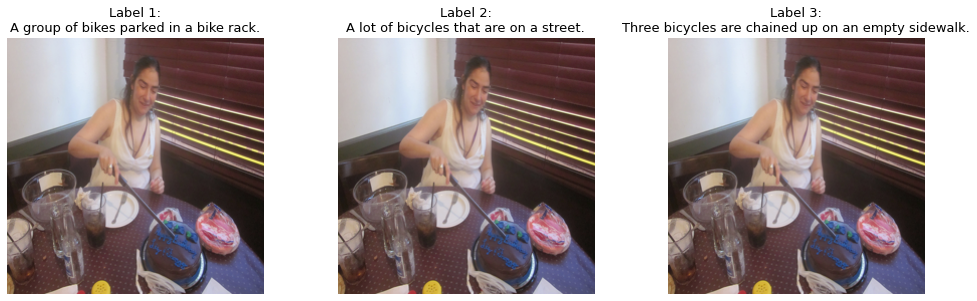

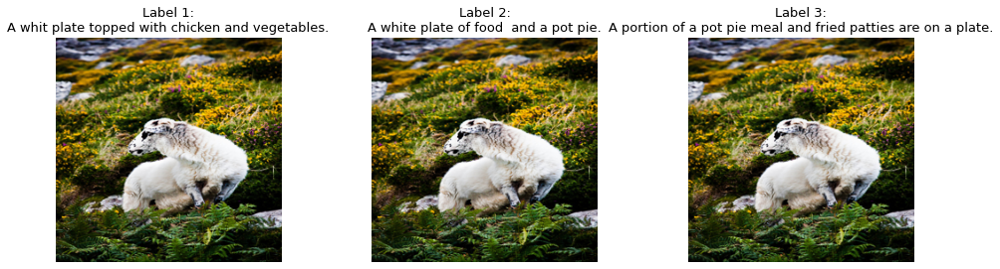

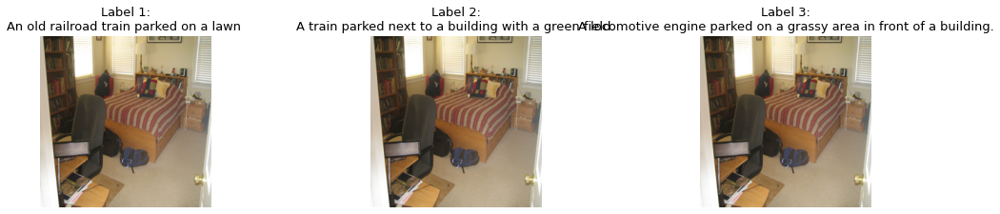

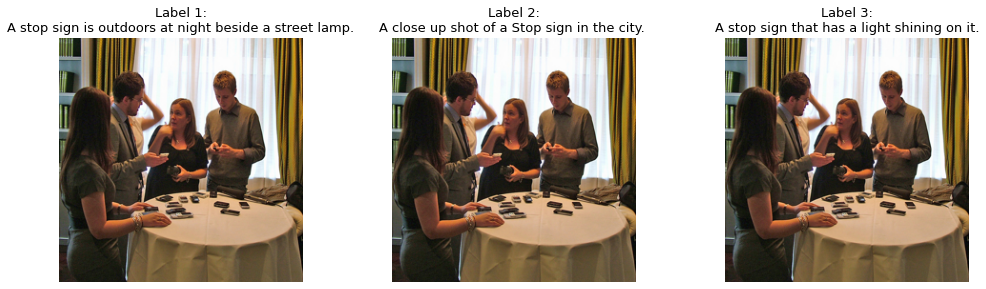

In [ ]:
imgs_new = imgs['images']
# print('Types in images'
# '\n')
# print(f'type: {imgs_new.dtype} {type(imgs_new)} {type(imgs_new[0])}\nshape: {imgs_new.shape}'
# '\n')
# print('Types in captions'
# '\n')
# print(f'type: {type(captions)}, {type(captions[0])} len: {len(captions)}, {len(captions[0])}'
# '\n')

for j in range(6):
  img = Image.fromarray(imgs_new[j].reshape(256,256,3))
  # display(img)
  with open('/content/drive/MyDrive/Deep Learning/Image_captioning/TRAIN_CAPTIONS_coco_5_cap_per_img.json') as json_file:
  # with open('/content/TRAIN_CAPTIONS_coco_5_cap_per_img.json') as json_file:
      captions = json.load(json_file)
  fig, ax = plt.subplots(1, 3, figsize=(14,6))
  for i in range(3):
    ax[i].imshow(img)
    ax[i].set_title(f'Label {i+1}:'
    '\n'
    f"{captions[j][i]}", fontsize = 13)
    ax[i].axis('off')

  fig.patch.set_alpha(0.5)
  plt.tight_layout()
  plt.show()

#Carregamento dos dados

In [ ]:
ENCODER = 'efficientnet-b0'
DECODER = 't5-small'
BATCH_SIZE = 4
NUM_WORKERS = 1

In [ ]:
#Para a normalização, usamos a sugerida neste github: https://github.com/lukemelas/EfficientNet-PyTorch/blob/master/README.md

transform = transforms.Compose([
    transforms.Lambda(lambda img: img * 2.0  - 1.0),
])

tokenizer = T5Tokenizer.from_pretrained(DECODER)

Downloading:   0%|          | 0.00/773k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/transformers/models/t5/tokenization_t5.py:174: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-small automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


In [ ]:
train_img_path = "/content/TRAIN_IMAGES_coco_5_cap_per_img.hdf5"
# train_img_path = "drive/MyDrive/Deep Learning/Image_captioning/TRAIN_IMAGES_coco_5_cap_per_img.hdf5"
# train_label_path = "drive/MyDrive/Deep Learning/Image_captioning/TRAIN_CAPTIONS_coco_5_cap_per_img.json"
train_label_path = "TRAIN_CAPTIONS_coco_5_cap_per_img.json"
val_img_path = "/content/VAL_IMAGES_coco_5_cap_per_img.hdf5"
val_label_path = "/content/VAL_CAPTIONS_coco_5_cap_per_img.json"
test_img_path = "/content/TEST_IMAGES_coco_5_cap_per_img.hdf5"
test_label_path = "/content/TEST_CAPTIONS_coco_5_cap_per_img.json"

train_label = json.load(open(train_label_path))
val_label = json.load(open(val_label_path))
test_label = json.load(open(test_label_path))

In [ ]:
class ImageCaptionDataset(Dataset):
    def __init__(self, img_file, captions, img_transform=lambda x: x, text_transform=lambda x: x):
        # We need to defer loading the images as h5py files cant be forked.
        # Ref: https://github.com/pytorch/pytorch/issues/11929
        self.img_file = img_file
        self.captions = captions
        self.img_transform = img_transform
        self.text_transform = text_transform
        self.images = h5py.File(self.img_file, 'r') 

    def __len__(self):
        return len(self.captions)
    
    def __getitem__(self, idx):
        img = self.images["images"][idx]
        cap = self.captions[idx]
        img = img.astype(float)

        # Normalization.
        img = (img - img.min()) / np.max([img.max() - img.min(), 1])
        # img = img/255

        return self.img_transform(img), self.text_transform(cap)#, label_token_ids

    def test(self):
        fig, ax = plt.subplots(3, 1, figsize=(8, 16))
        samples = np.random.randint(0, high=self.__len__(), size=3)
        img1, text1 = self.__getitem__(samples[0])
        img2, text2 = self.__getitem__(samples[1])
        img3, text3 = self.__getitem__(samples[2])

        # img1 = (img1.reshape(256,256,3)+1)/2
        # img2 = (img2.reshape(256,256,3)+1)/2
        # img3 = (img3.reshape(256,256,3)+1)/2

        img1 = (np.transpose(img1, (1,2,0)) + 1)/2
        img2 = (np.transpose(img2, (1,2,0)) + 1)/2
        img3 = (np.transpose(img3, (1,2,0)) + 1)/2

        ax[0].imshow(img1)
        ax[0].set_title(f'Caption: {text1[0]}')
        # ax[0].set_xlabel(f'Token: {token1}')

        ax[1].imshow(img2)
        ax[1].set_title(f'Caption: {text2[0]}')
        # ax[1].set_xlabel(f'Token: {token2}')

        ax[2].imshow(img3)
        ax[2].set_title(f'Caption: {text3[0]}')
        # ax[2].set_xlabel(f'Token: {token3}')

        plt.tight_layout()
        plt.show()

In [ ]:
trainset = ImageCaptionDataset(train_img_path, train_label, img_transform=transform)
valset = ImageCaptionDataset(val_img_path, val_label, img_transform=transform)
testset = ImageCaptionDataset(test_img_path, test_label, img_transform=transform)

In [ ]:
trainset.images['images']

<HDF5 dataset "images": shape (23520, 3, 256, 256), type "|u1">

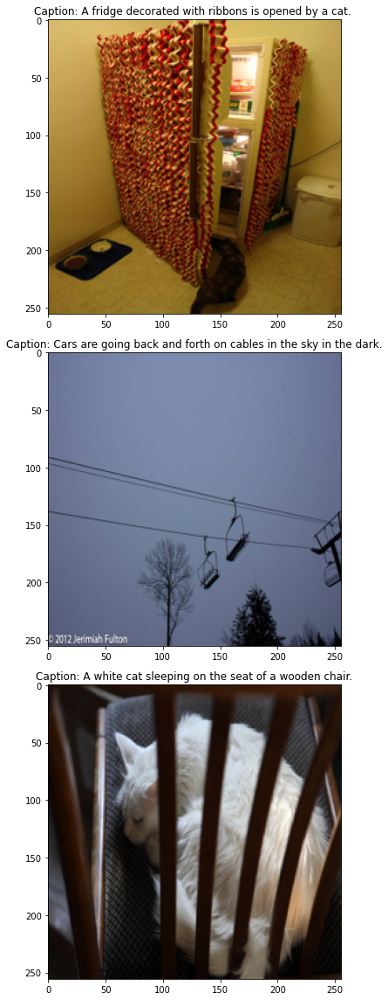

In [ ]:
trainset.test()

In [ ]:
'''
A função collate_any seleciona um label aleatório dentre os 5 correspondentes a figura,
e uma vez definido o label realiza-ra o tokenização do mesmo de ocordo com o encoded de
T5. Sendo este usado no Dataset de treino
'''

def collate_any(batch):
   
    imgs = torch.tensor(np.array([r[0] for r in batch]), dtype=torch.float)
    labels = np.array([random.choice(r[1]) for r in batch])
    
    batch_tokens = tokenizer.batch_encode_plus(
        labels,
        padding="longest",
        return_tensors="pt")['input_ids']

    return imgs, labels, batch_tokens

'''
 Um processo semelhante é aplicado pela collate_all, entretanto neste usa-se
 os 5 labels de cada imagem, passando eles pelo tokenizador. Sendo este metodo
 usado para os datasets de validação e teste.
'''
def collate_all(batch):
  
    imgs = torch.tensor(np.array([r[0] for r in batch]), dtype=torch.float)
    labels = np.array([r[1] for r in batch])

    encoded = [tokenizer.batch_encode_plus(label, 
                                           padding="longest", 
                                           return_tensors='pt')['input_ids']
    for label in labels]
            
    return imgs, labels, encoded

###Criando o dataset

In [ ]:
lr = 5e-4
bs = 32
patience = 5
max_epochs = 15
seq_len = 32
# Define hyperparameters
params = {
          'model_name': DECODER,
          'batch_size': bs,
          'num_workers': os.cpu_count(),
          'learning_rate': lr,
          'max_epochs': max_epochs, 
          'patience': patience,
          'monitor_variable': 'val_bleu_score',
          'seq_len':seq_len
      }
print(params)

{'model_name': 't5-small', 'batch_size': 32, 'num_workers': 2, 'learning_rate': 0.0005, 'max_epochs': 15, 'patience': 5, 'monitor_variable': 'val_bleu_score', 'seq_len': 32}


In [ ]:
trainloader = DataLoader(trainset,
                          shuffle=True,
                          batch_size=params['batch_size'],
                          num_workers=params['num_workers'],
                          collate_fn=collate_any)

valloader = DataLoader(valset,
                        batch_size=1,
                        num_workers=params['num_workers'],
                        collate_fn=collate_all)

testloader = DataLoader(testset,
                         num_workers=params['num_workers'],
                         collate_fn=collate_all)

#Criando o modelo

In [ ]:
from sacrebleu.metrics import BLEU, CHRF, TER
bleu = BLEU()
chrf = CHRF()

In [ ]:
test_img = torch.Tensor(imgs['images'][0].reshape(1,3,256,256))

In [ ]:
out_features = EfficientNet.from_pretrained(ENCODER, advprop=True).extract_endpoints(test_img)["reduction_4"]

Loaded pretrained weights for efficientnet-b2


In [ ]:
out_features.shape

torch.Size([1, 120, 16, 16])

In [ ]:
from transformers import AdamW

class EfficientT5(pl.LightningModule):
    def __init__(self, train_dataloader, val_dataloader, test_dataloader, params):
        super(EfficientT5, self).__init__()

        self.params = params
        
        self._train_dataloader = train_dataloader
        self._val_dataloader   = val_dataloader
        self._test_dataloader  = test_dataloader

        # EfficientNet image encoder.
        self.encoder = EfficientNet.from_pretrained('efficientnet-b0', advprop=True)

        # Features da efficient net atuarão como as features do encoder do T5
        self.decoder = T5ForConditionalGeneration.from_pretrained(params['model_name'])

        # Patch convolution. Basically tranform the 2D image into 16x16 patches with 2048 dimensions.
        self.bridge = nn.Conv2d(in_channels=112, out_channels=self.decoder.config.d_model, kernel_size=1)
        
        # Convert patches from 2048 to 512 dimensions.
        self.linear = nn.Linear(self.decoder.config.d_ff, self.decoder.config.d_model)

        self.tokenizer = T5Tokenizer.from_pretrained(params['model_name'], skip_special_tokens=True)
        self.learning_rate = params['learning_rate']

    def generate_decoder_only(self, efn_embeddings):
        encoder_outputs = self.decoder.encoder(inputs_embeds = efn_embeddings)
        decoder_token_ids = self.decoder.generate(encoder_outputs = encoder_outputs, max_length = self.params['seq_len'])
        return decoder_token_ids


    def forward(self, batch):

        images, labels, tokens = batch

        features = model.encoder.extract_endpoints(images)["reduction_4"]
        features = self.bridge(features)

        efn_embeddings = features \
            .permute(0, 2, 3, 1) \
            .reshape(features.shape[0], -1, self.decoder.config.d_ff)

        
        # Resize to transformer dimension.
        efn_embeddings = self.linear(efn_embeddings)

        if self.training:
            outputs = self.decoder(inputs_embeds=efn_embeddings,
                                   decoder_input_ids=None, 
                                   labels=tokens,
                                   return_dict=True)
            return outputs.loss
        else:
            max_length = self.params['seq_len']

            # Add start of sequence token
            decoded_ids = self.generate_decoder_only(efn_embeddings)
            return decoded_ids

    def training_step(self, batch, batch_idx): 
        loss = self(batch)
        self.log('loss', loss, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        pred_tokens = self(batch)
        # Tokens -> String
        decoded_pred = [self.tokenizer.decode(tokens) for tokens in pred_tokens]
        return {"pred": decoded_pred, "target": batch[1]}

    def test_step(self, batch, batch_idx):
        pred_tokens = self(batch)
        # Tokens -> String
        decoded_pred = [self.tokenizer.decode(tokens) for tokens in pred_tokens]
        return {"pred": decoded_pred, "target": batch[1]}

    def validation_epoch_end(self, outputs):
        trues = sum([list(x['target']) for x in outputs], [])
        preds = sum([list(x['pred']) for x in outputs], [])

        n = random.choice(range(len(trues)))
        print(f"\nSample Target: {trues[n]}\nPrediction: {preds[n]}\n")

        # Sobre como o corpus_bleu interpreta os inputs: 
        # https://github.com/mjpost/sacreBLEU/issues/28
        bleu_result = bleu.corpus_score(preds, list(zip(*trues)))
        self.log("val_bleu_1", bleu_result.precisions[0], prog_bar=True)
        self.log("val_bleu_4", bleu_result.precisions[3], prog_bar=True)

        self.log("val_bleu_score", bleu_result.score, prog_bar=True)


    def test_epoch_end(self, outputs):
        trues = sum([list(x['target']) for x in outputs], [])
        preds = sum([list(x['pred']) for x in outputs], [])

        n = random.choice(range(len(trues)))
        print(f"\nSample Target: {trues[n]}\nPrediction: {preds[n]}\n")

        # Sobre como o corpus_bleu interpreta os inputs: 
        # https://github.com/mjpost/sacreBLEU/issues/28
        bleu = sacrebleu.corpus_bleu(preds, list(zip(*trues)))

        self.log("test_bleu_score", bleu.score, prog_bar=True)
        self.log("test_bleu_1", bleu.precisions[0], prog_bar=True)
        self.log("test_bleu_4", bleu.precisions[3], prog_bar=True)

    def configure_optimizers(self):
        return AdamW(self.parameters(), lr=5e-4)

    def train_dataloader(self):
        return self._train_dataloader

    def val_dataloader(self):
        return self._val_dataloader

    def test_dataloader(self):
        return self._test_dataloader

In [ ]:
model = EfficientT5(train_dataloader=trainloader,
                    val_dataloader=valloader,
                    test_dataloader=testloader,
                    params=params)

# model = model.load_from_checkpoint("/content/drive/MyDrive/Deep Learning/Image_captioning/Logs/Image_caption/version_3/checkpoints/epoch=4-step=12935.ckpt",
#                                    train_dataloader = trainloader,
#                                    val_dataloader = valloader,
#                                    test_dataloader = testloader,
#                                    params = params)

Loaded pretrained weights for efficientnet-b0


/usr/local/lib/python3.7/dist-packages/transformers/models/t5/tokenization_t5.py:174: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-small automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


In [ ]:
trainer = pl.Trainer(gpus=1, 
                     max_epochs=1,
                     enable_checkpointing=False, 
                     fast_dev_run=True)

trainer.fit(model)
trainer.test(model)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Running in fast_dev_run mode: will run a full train, val, test and prediction loop using 1 batch(es).
`Trainer(limit_train_batches=1)` was configured so 1 batch per epoch will be used.
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
`Trainer(limit_test_batches=1)` was configured so 1 batch will be used.
`Trainer(limit_predict_batches=1)` was configured so 1 batch will be used.
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarn

Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/data.py:73: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 32. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  "Trying to infer the `batch_size` from an ambiguous collection. The batch size we"


Validation: 0it [00:00, ?it/s]


Sample Target: ['Girl in a tank top holding a kitten in her back yard'
 'A young girl is holding a small cat.'
 'A girl smiles as she holds a kitty cat.'
 'Girl with a yellow shirt holding a small cat'
 'A little girl holding a kitten next to a blue fence.']
Prediction: <pad> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]


Sample Target: ['A large jetliner sitting on top of an airport runway.'
 'View from gate of jet connected to jet way for passengers to board or deplane'
 'Airline employees by an aircraft parked at the gate'
 'A large white airplane and a person on a lot.'
 'The plane is parked at the gate at the airport terminal.']
Prediction: <pad> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       test_bleu_1                  0.0
       test_bleu_4                  0.0
     test_bleu_score                0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_bleu_1': 0.0, 'test_bleu_4': 0.0, 'test_bleu_score': 0.0}]

#Treinamento

In [ ]:
logger = pl.loggers.csv_logs.CSVLogger(f"/content/drive/MyDrive/Deep Learning/Image_captioning/Logs/Efficient-b0+t5-small", name = 'Image_caption')

early_stop_callback = pl.callbacks.EarlyStopping(monitor='val_bleu_score', patience=params['patience'], mode='max')

checkpoint_callback = pl.callbacks.ModelCheckpoint(dirpath='/content/drive/MyDrive/Deep Learning/Image_captioning/EfficientNet-b0-{epoch}-{val_bleu_socre:.2f}',
                                                   monitor='val_bleu_score')

trainer = pl.Trainer(
    gpus=1,
    max_epochs=params['max_epochs'],
    logger=logger, 
    callbacks=[early_stop_callback],
    checkpoint_callback=checkpoint_callback,
    # Run validation over a smaller sample.
    limit_val_batches=.5,
)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:152: LightningDeprecationWarning: Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f91f2e9e810>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f91f2e9e810>)`.
  f"Setting `Trainer(checkpoint_callback={checkpoint_callback})` is deprecated in v1.5 and will "
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(model)

Missing logger folder: /content/drive/MyDrive/Deep Learning/Image_captioning/Logs/Efficient-b0+t5-small/Image_caption
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,

  | Name    | Type                       | Params
-------------------------------------------------------
0 | encoder | EfficientNet               | 5.3 M 
1 | decoder | T5ForConditionalGeneration | 60.5 M
2 | bridge  | Conv2d                     | 57.9 K
3 | linear  | Linear                     | 1.0 M 
-------------------------------------------------------
66.9 M    Trainable params
0         Non-trainable params
66.9 M    Total params
267.608   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]


Sample Target: ['Girl in a tank top holding a kitten in her back yard'
 'A young girl is holding a small cat.'
 'A girl smiles as she holds a kitty cat.'
 'Girl with a yellow shirt holding a small cat'
 'A little girl holding a kitten next to a blue fence.']
Prediction: <pad> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


Sample Target: ['A dog pants next to a bowl of water on the ground'
 'A dog is laying with its water dish in front of it.'
 'A brown dog laying on the ground with a metal bowl in front of him.'
 'The brown dog is laying near a silver dog bowl.'
 'a close up of a dog near a bowl']
Prediction: <pad> A dog is laying on a bed with a dog.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A bird perched on top of a leaf filled tree.'
 'A white and blue bird is perched on a tree branch that is sitting next to a bunch of bushes.'
 'A black and white bird with a long tail, perched on a branch.'
 'The black and white bird is perched on a branch.'
 'a small white and black bird is standing on a branch']
Prediction: <pad> A bird sitting on a branch in a tree.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['Two elephants in an enclosure are looking at a fallen tree.'
 'Two elephants near a log surrounded by rocks'
 'Elephants stand together near a log in an enclosure. '
 'The two elephants are inspecting the tree trunk.'
 'Old, tusked elephants in a zoo enclosure with log']
Prediction: <pad> A man is standing on a horse in a field.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A living room with blue walls and white trim.'
 'a light a few ceiling fans a bicycle a couch and windows'
 'A full view of a living room in a house. '
 'A room with a wooden floor and blue walls.'
 'A view of a living room from across the room, there are bikes everywhere.']
Prediction: <pad> A large white house with a large white house.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A black and white cat chewing on a toy.'
 'a cat playing with a stuffed toy on the carpet'
 'The grey and white cat is playing with a small yellow toy.'
 "Cat licking a cat toy with it's tongue."
 'A cat is playing with the toy banana. ']
Prediction: <pad> A dog is laying on a bed with a stuffed animal.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A black and white cat chewing on a toy.'
 'a cat playing with a stuffed toy on the carpet'
 'The grey and white cat is playing with a small yellow toy.'
 "Cat licking a cat toy with it's tongue."
 'A cat is playing with the toy banana. ']
Prediction: <pad> A cat laying on a bed with a stuffed animal.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['a car leads a bunch of people down a street '
 'A huge crowd is walking down one side of a street.'
 'A cop car driving down a street with a crowd walking behind it.'
 'There is a large group of people on the road behind the police car.'
 'A street jam packed with cyclists being escorted']
Prediction: <pad> A group of people standing around a street sign.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A man sitting in front of the pen with a dog herding sheep in the background.'
 'A LOT OF SHEEP IS IN THE GRASS WITH A SHEEP DOG'
 'A dog chasing a group of three sheep.'
 'A border collie herds three sheep toward a pen.'
 'A sheep dog is herding three lambs across a field.']
Prediction: <pad> A man is standing on a bench with a dog.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A row of cars parked on a street with parking meters.'
 'A parking meter on a street by a car with traffic.'
 'A series of parking meters and cars are located next to each other. '
 'A row of parked cars sitting next to parking meters.'
 'A parking meter on a street with cars']
Prediction: <pad> A cat sitting on a chair next to a laptop.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['several airplanes on a landing strip next to grass'
 'Sever airplanes are parked on an airport runway.'
 'A bunch of airplanes parked on an overgrown airfield.'
 'An airplane sits on the ground with many other planes'
 'A group of jet planes sitting on top of an airport tarmac.']
Prediction: <pad> A large jetliner sitting on top of an airport tarmac.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A woman on a moped, two men and animals walking down the road.'
 'A woman on a motorcycle is next to a man walking a dog along with other people going down a dirt road.'
 'A woman riding a motorcycle down a dirt road.'
 'there is a woman riding a scooter down a dirt road'
 'A person on a motor bike next to a cow.']
Prediction: <pad> A man and a dog are standing in front of a tree.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A group of people riding in a black raft.'
 'A group of people are in an inner tube looking boat.'
 'Four adults and a child are rafting through river rapids.'
 'Some people are rafting together on a river'
 'A group of five people enjoying a white water rafting experience']
Prediction: <pad> A man riding a horse in a field.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['The man in the red tie is putting on his glasses.'
 'A young girl wearing a red tie is adjusting her glasses. '
 "The man wearing a red tie is standing near an animal's plastic house."
 'A person with glasses and a tie in a room.'
 'a woman wearing glasses a shirt and tie']
Prediction: <pad> A man holding a hot dog in his hand.</s>



Validation: 0it [00:00, ?it/s]


Sample Target: ['A woman sitting on a couch with a laptop as a cat looks on.'
 'a woman in living area with cats and a laptop.'
 'A lady sitting on a couch using a laptop in a living room.'
 'A lazy sitting on the coach with her laptop.'
 'A woman sitting on a couch using a laptop computer.']
Prediction: <pad> A living room with a couch, couch, and a table.</s>



# Meteor Score

In [ ]:
full_string = 'As cartas de amor, se há amor, têm de ser ridículas. Mas, afinal, só as criaturas que nunca escreveram cartas de amor é que são ridículas'
tokens = word_tokenize(full_string)

meteors = np.zeros((len(tokens),len(tokens)))

for i in tqdm(range(len(tokens))):
  for j in range(len(tokens)):
    meteors[i,j] = round(meteor_score([tokens[:i]], tokens[:j]), 4)

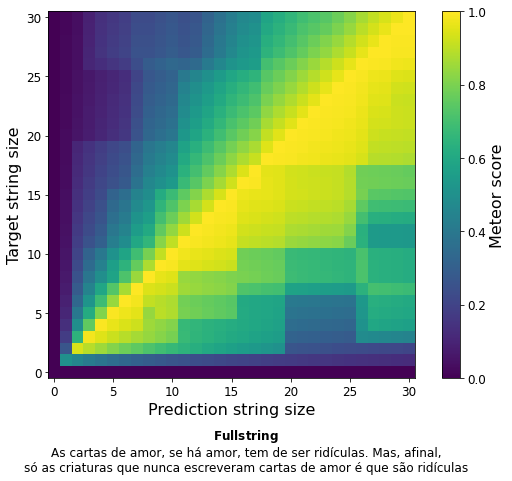

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
cont = plt.imshow(meteors)
plt.ylim(-0.5, len(tokens)-0.5)
plt.xlim(-0.5, len(tokens)-0.5)
cb = plt.colorbar(cont, cmap = 'viridis')
cb.set_label('Meteor score', size=16)
cb.ax.tick_params(labelsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Prediction string size', fontsize = 16)
plt.ylabel('Target string size', fontsize = 16)
fig.text(0.5,-0.1, r'$\bf{Full string}$'
'\n'
'As cartas de amor, se há amor, tem de ser ridículas. Mas, afinal,'
'\n'
'só as criaturas que nunca escreveram cartas de amor é que são ridículas', ha = 'center',
fontsize = 12)
plt.tight_layout()
plt.savefig('meteor_score.svg', dpi = 300, bbox_inches = 'tight')

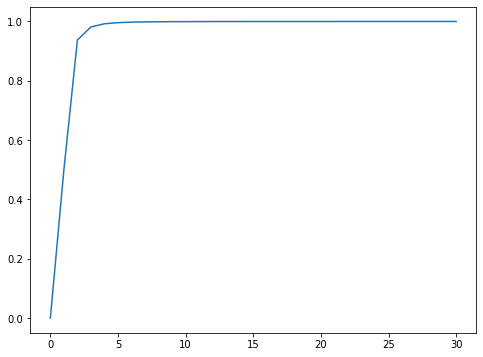

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
cont = plt.plot(np.diag(np.mat(meteors)))

In [ ]:
full_string = 'There are three things all wise men fear: the sea in storm, a night with no moon, and the anger of a gentle man.”'
tokens = word_tokenize(full_string)

meteors = np.zeros((len(tokens),len(tokens)))

for i in tqdm(range(len(tokens))):
  for j in range(len(tokens)):
    meteors[i,j] = round(meteor_score([tokens[:i]], tokens[:j]), 4)


100%|██████████| 29/29 [00:00<00:00, 103.69it/s]


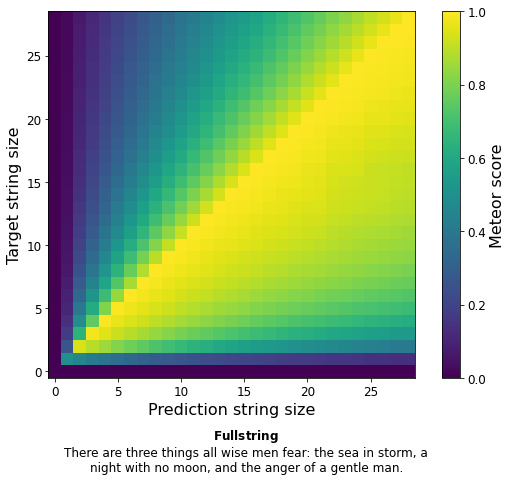

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
cont = plt.imshow(meteors)
plt.ylim(-0.5, len(tokens)-0.5)
plt.xlim(-0.5, len(tokens)-0.5)
cb = plt.colorbar(cont, cmap = 'viridis')
cb.set_label('Meteor score', size=16)
cb.ax.tick_params(labelsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Prediction string size', fontsize = 16)
plt.ylabel('Target string size', fontsize = 16)
fig.text(0.5,-0.1, r'$\bf{Full string}$'
'\n'
'There are three things all wise men fear: the sea in storm, a'
'\n'
'night with no moon, and the anger of a gentle man.', ha = 'center',
fontsize = 12)
plt.tight_layout()
plt.savefig('meteor_score_en.svg', dpi = 300, bbox_inches = 'tight')

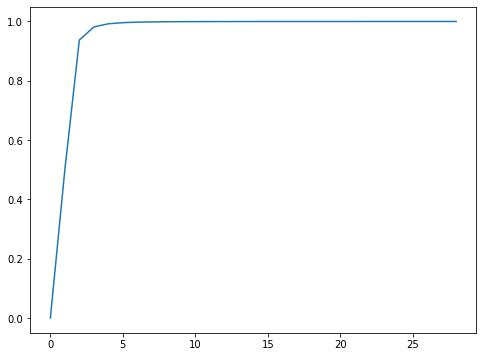

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
cont = plt.plot(np.diag(np.mat(meteors)))

In [ ]:
print(meteor_score([word_tokenize('I')],
             word_tokenize('I like')))

print(meteor_score([word_tokenize('I')],
             word_tokenize('I want')))

print(meteor_score([word_tokenize('I like')],
             word_tokenize('I')))

print(meteor_score([word_tokenize('I like')],
             word_tokenize('I like')))

print(meteor_score([word_tokenize('The')],
             word_tokenize('The')))

0.45454545454545453
0.45454545454545453
0.2631578947368421
0.9375
0.5


#Teste

In [ ]:
metrics = pd.read_csv('drive/MyDrive/Deep Learning/Image_captioning/Logs/Image_caption/version_3/metrics.csv')

Text(0, 0.5, 'BLEU score')

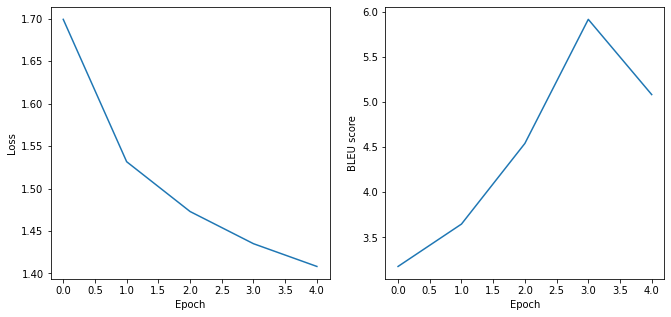

In [ ]:
fig, ax = plt.subplots(1,2, figsize= (11, 5))
ax[0].plot(metrics['loss_epoch'].dropna().reset_index(drop=True))
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')

ax[1].plot(metrics['val_bleu_score'].dropna().reset_index(drop=True))
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('BLEU score')

In [ ]:
model.eval()

trainer.test(model)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]


Sample Target: ['A dining room window with many potted and hanging plants.'
 'Several potted plants in front of a window.'
 'Plants sitting near an open window inside a house. '
 'A chair and some plants are sitting next to the window.'
 'A window in a kitchen filled with green plants.']
Prediction: <pad> A man sitting on a bench with a dog in the back of it.</s>

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       test_bleu_1           35.7767333984375
       test_bleu_4          1.2306114435195923
     test_bleu_score         6.589345455169678
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_bleu_1': 35.7767333984375,
  'test_bleu_4': 1.2306114435195923,
  'test_bleu_score': 6.589345455169678}]

In [ ]:
test_loader = DataLoader(testset, batch_size = 1, collate_fn = collate_all)
meteors = []

for batch, i in zip(test_loader, range(len(test_loader))):
  images, labels, tokens = batch
  model.eval()
  model.cpu()
  pred_tokens = model(batch)
  decoded_preds = [model.tokenizer.decode(t) for t in pred_tokens]
  labels_tokenized = []
  for j in range(5):
    labels_tokenized.append(word_tokenize(labels[0][j]))
  # print(decoded_preds)
  # print(labels)
  meteors.append(meteor_score(labels_tokenized, word_tokenize(decoded_preds[0])[3:]))

print('\n'
f'Average meteor score in test set: {np.mean(meteors)} +/- {np.std(meteors)}'
'\n'
f'Max meteor: {np.max(meteors)}'
'\n'
f'Min meteor: {np.min(meteors)}')


Average meteor score in test set: 0.26593930621796436 +/- 0.1259766591909846
Max meteor: 0.7336571544221817
Min meteor: 0.0


In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
plt.hist(meteors, bins = [0.06667*i for i in range(16)], edgecolor='black', color = 'crimson')
plt.xlabel('Meteor Score', fontsize = 14)
plt.ylabel('Number of images', fontsize = 14)
plt.axvline(np.mean(meteors), ls = '--', color = 'black', label = 'Mean')
plt.axvline(np.median(meteors), ls = 'dotted', color = 'teal', label = 'Median')
plt.legend(loc = 'upper right', fontsize = 12)
# plt.ylim(0, 150)
plt.xlim(0, 1)
plt.savefig('Meteor_score_distrib_efficientnet-b2.png', dpi = 300, bbox_inches = 'tight')
plt.savefig('Meteor_score_distrib_efficientnet-b2.svg', dpi = 300, bbox_inches = 'tight')
plt.show()

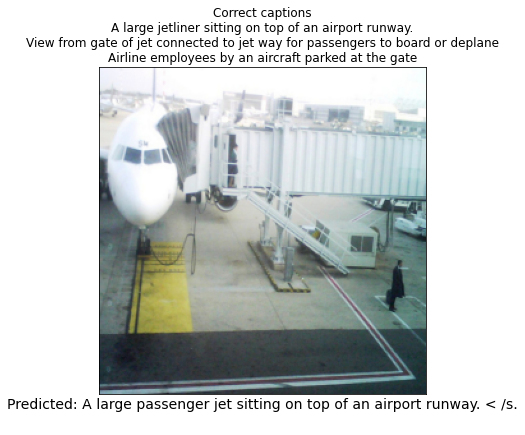

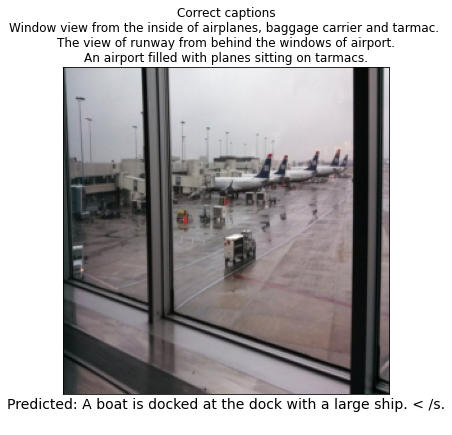

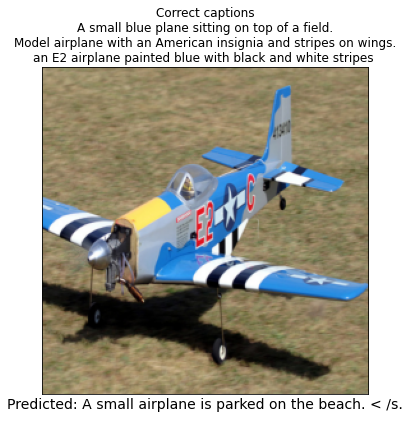

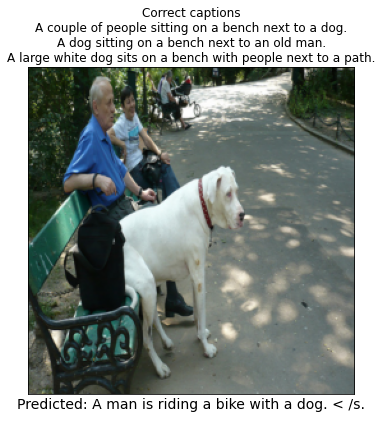

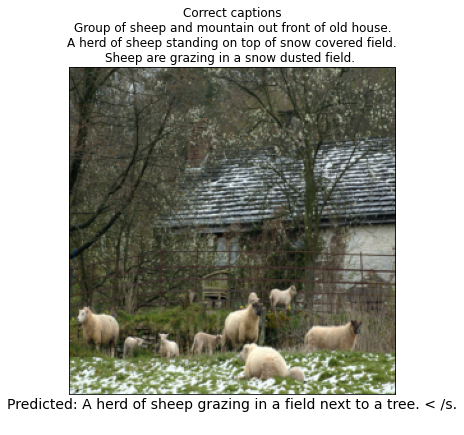

...

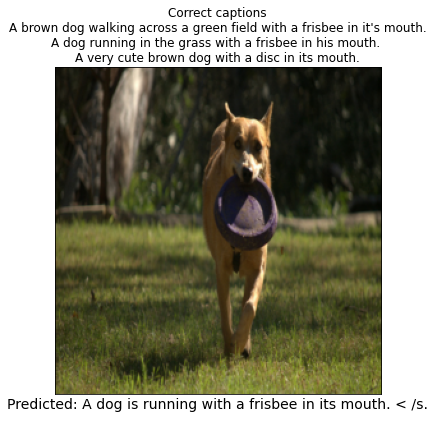

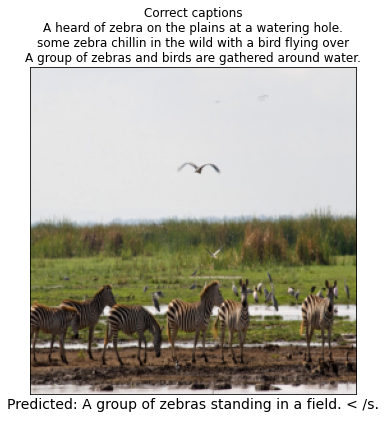

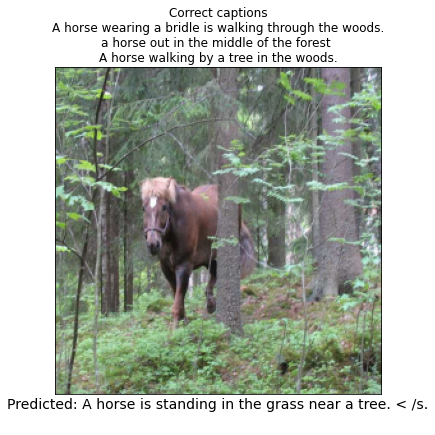

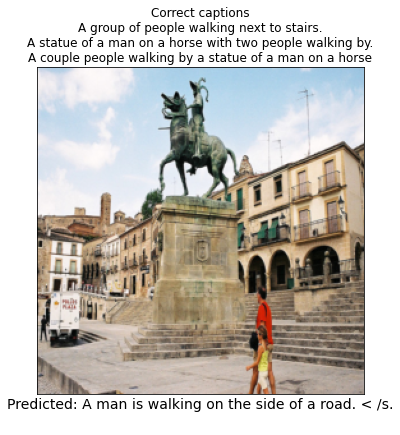

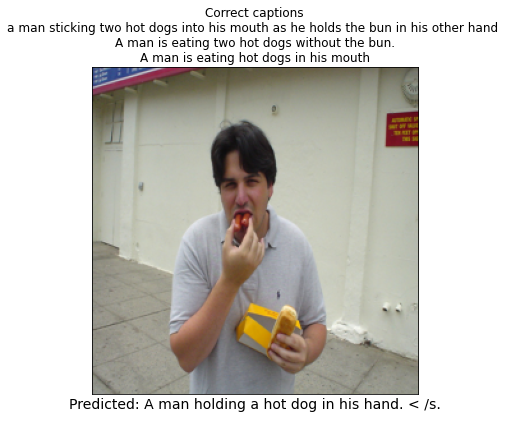

In [ ]:
import cv2

test_loader = DataLoader(testset, batch_size=1, collate_fn=collate_all)

for batch, i in zip(test_loader, range(48)):
        
    images, labels, tokens = batch

    model.eval()
    model.cpu()

    pred_tokens = model(batch)

    decoded_preds = [model.tokenizer.decode(t) for t in pred_tokens]

    for image, label, pred in zip(images, labels, decoded_preds):
        plt.figure(figsize=(8,6))
        plt.imshow((image.squeeze(0).numpy().transpose(1, 2, 0)+1) / 2)
        plt.xticks([])
        plt.yticks([])
        plt.title(f'Correct captions'
        '\n'
        f'{label[0]}'
        '\n'
        f'{label[1]}'
        '\n'
        f'{label[2]}')
        plt.xlabel(f"Predicted: {' '.join(word_tokenize(pred)[3:-1])+'.'}"
        '\n', fontsize = 14)
        plt.show()

# Teste com imagens próprias

In [ ]:
model = model.load_from_checkpoint("/content/drive/MyDrive/Deep Learning/Image_captioning/Logs/Efficient-b0+t5-small/Image_caption/version_0/checkpoints/epoch=13-step=10290.ckpt",
                                   train_dataloader = trainloader,
                                   val_dataloader = valloader,
                                   test_dataloader = testloader,
                                   params = params)
model.eval()

Loaded pretrained weights for efficientnet-b0


/usr/local/lib/python3.7/dist-packages/transformers/models/t5/tokenization_t5.py:174: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-small automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


EfficientT5(
  (encoder): EfficientNet(
    (_conv_stem): Conv2dStaticSamePadding(
      3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d((0, 1, 0, 1))
    )
    (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
          (static_padding): ZeroPad2d((1, 1, 1, 1))
        )
        (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          32, 8, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          8, 32, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_project_conv): Conv2dStaticSamePadding

In [ ]:
from matplotlib.image import imread
files = os.listdir('/content/drive/MyDrive/Deep Learning/Image_captioning')[1:]

imgs = []
imgs_network = []
for file in files:
  try:
    img_first = imread(f'/content/drive/MyDrive/Deep Learning/Image_captioning/{file}')
    imgs.append(img_first[:,:,:3])
    img = img_first[:,:,:3].reshape(3, 256, 256)
    imgs_network.append(img)
  except:
    print(f'Não deu não hein: {file}')
    continue

imgs_network = np.array(imgs_network)
imgs_network.shape

Não deu não hein: TRAIN_CAPTIONS_coco_5_cap_per_img.json
Não deu não hein: Image_test_14.jpg
Não deu não hein: TRAIN_IMAGES_coco_5_cap_per_img.hdf5


(13, 3, 256, 256)

In [ ]:
h5py.File(test_img_path, 'r')['images']

<HDF5 dataset "images": shape (1047, 3, 256, 256), type "|u1">

In [ ]:
hf = h5py.File('data.hdf5', 'w')
hf.create_dataset('images', data=imgs_network)
hf.close()

In [ ]:
h5py.File('./data.hdf5', 'r')['images']

<HDF5 dataset "images": shape (12, 3, 256, 256), type "<f4">

In [ ]:
caption = [['A minion is cruxified',
           'An yellow creature attached to a crux'],
           ['A man is looking at the sunset close to a lake'],
           ['A boy laughs while siting on top of tree'],
           ['A beautiful woman lies sitting on the floor leaning on the wall'],
           ['A young woman is painting the wall'],
           ['A man is carrying a drunk man on this back',
            'A drunk man is cosplaying a koala'],
           ['Three people smilling in a field full of flowers'],
           ['It looks like three persons who should date themselves'],
           ['A crush'],
           ['A man is celebrating a goal from his team'],
           ['Two cute guys are hugging each other close to a fire'],
           ['An elephant made of strawberries walking in the grass'],
           ['que']]

In [ ]:
outset = ImageCaptionDataset('/content/data.hdf5', caption, img_transform=transform)

In [ ]:
outloader = DataLoader(outset,
                        shuffle=False,
                        batch_size=1,
                        collate_fn=collate_all)

In [ ]:
trainset.images

<HDF5 file "TRAIN_IMAGES_coco_5_cap_per_img.hdf5" (mode r)>

In [ ]:
outset.images

<HDF5 file "data.hdf5" (mode r)>

In [ ]:
len(outloader)

12

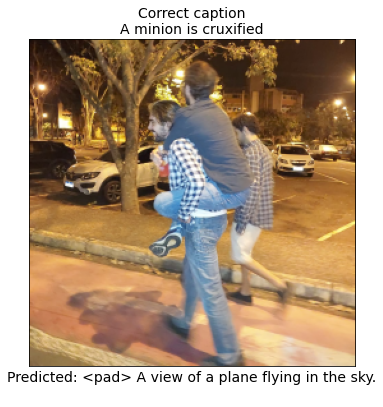

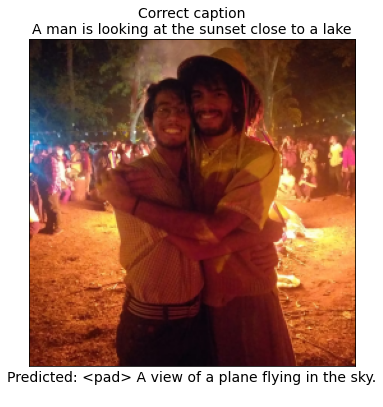

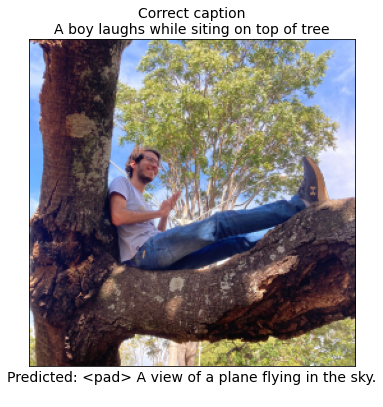

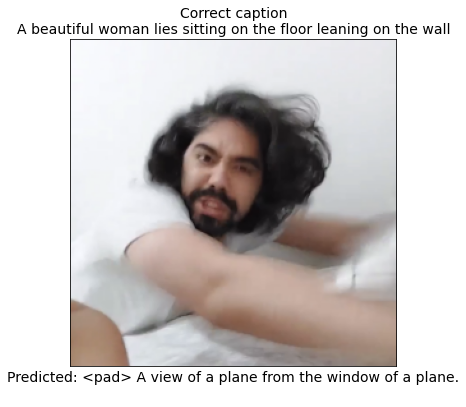

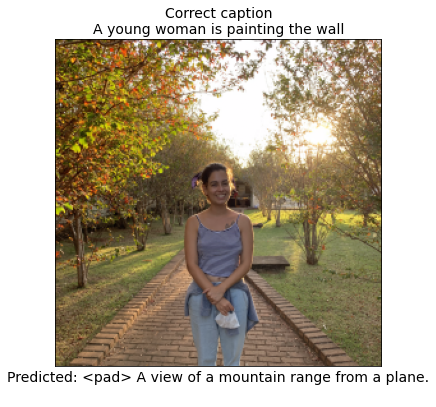

...

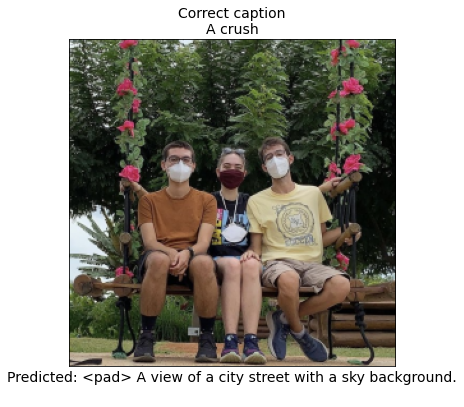

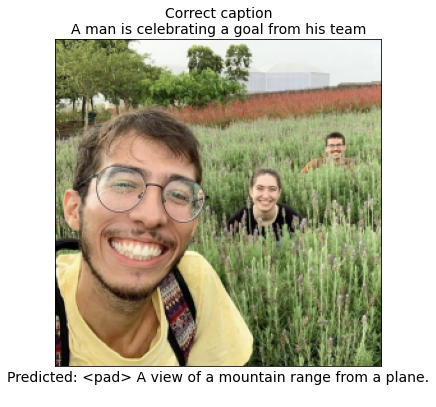

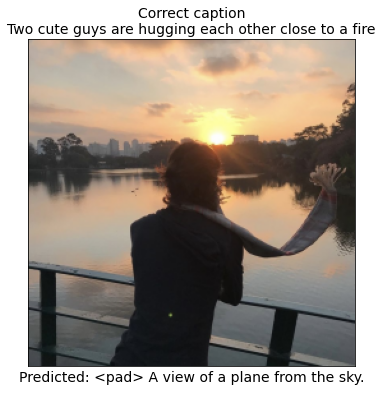

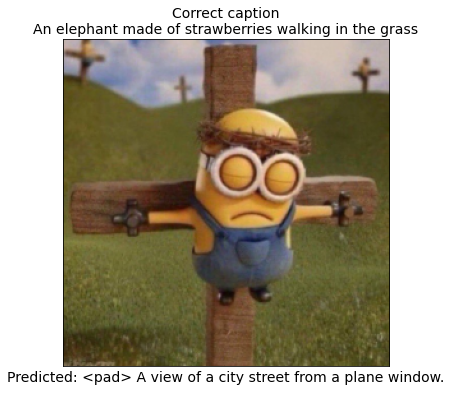

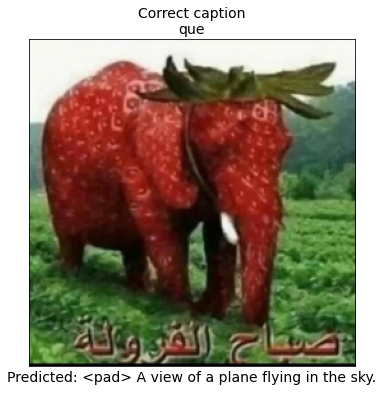

In [ ]:
for batch, i in zip(outloader, range(len(outloader))):
        
    images, labels, tokens = batch

    model.eval()
    model.cpu()

    pred_tokens = model(batch)

    decoded_preds = [model.tokenizer.decode(t) for t in pred_tokens]

    for image, label, pred in zip(images, labels, decoded_preds):
        fig = plt.figure(figsize=(8,6))
        plt.imshow(imgs[i])
        plt.xticks([])
        plt.yticks([])
        if len(labels) == 2:
          plt.title(f'Correct captions'
          '\n'
          f'{label[0]}'
          '\n'
          f'{label[1]}', fontsize = 14)
        elif len(labels) == 1:
          plt.title(f'Correct caption'
          '\n'
          f'{label[0]}', fontsize = 14)
        plt.xlabel(f'Predicted: {pred}'
        '\n', fontsize = 14)
        fig.patch.set_alpha(1)
        plt.show()

# Checagem da frequência de palavras

In [ ]:
import cv2

train_loader = DataLoader(trainset, batch_size=1, collate_fn=collate_all)

words = {}

for batch, i in zip(train_loader, range(len(train_loader))):
        
    images, labels, tokens = batch
    # print(word_tokenize(labels[0][0]))
    for j in range(5):
      for k in range(len(word_tokenize(labels[0][j]))):
        if word_tokenize(labels[0][j])[k] not in words.keys():
          words[word_tokenize(labels[0][j])[k]] = 1
        elif word_tokenize(labels[0][j])[k] in words.keys():
          words[word_tokenize(labels[0][j])[k]] += 1

In [ ]:
words_sorted = {k: v for k, v in sorted(words.items(), key=lambda item: item[1])}
words_sorted = OrderedDict(reversed(list(words_sorted.items())))

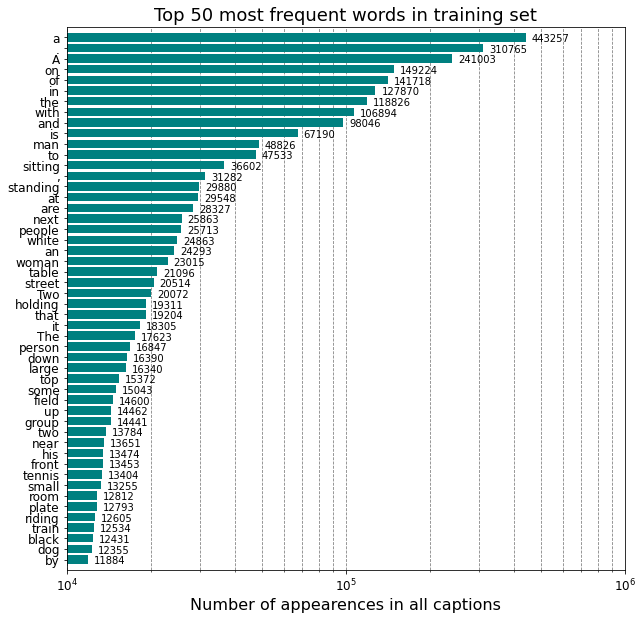

In [ ]:
size = 50
fig, ax = plt.subplots(figsize=(10,10))
ax.set_axisbelow(True)
ax.xaxis.grid(color='gray', linestyle='dashed', which='both')
plt.barh(list(words_sorted.keys())[:size], list(words_sorted.values())[:size],
         color = 'teal')
for i in range(len(list(words_sorted.keys())[:size])):
  plt.text(list(words_sorted.values())[i]*1.05, i+0.4, list(words_sorted.values())[i])
plt.ylim(len(list(words_sorted.values())[:size])+0.5, -1)
plt.yticks(fontsize = 12)
plt.xscale('log')
plt.xlim(1e4, 1e6)
plt.ylim(size, -1)
plt.title('Top 50 most frequent words in training set', fontsize = 18)
plt.xlabel('Number of appearences in all captions', fontsize = 16)
plt.xticks(fontsize = 12)
plt.savefig('top_most_frequent.png', dpi = 300, bbox_inches = 'tight')
plt.savefig('top_most_frequent.svg', dpi = 300, bbox_inches = 'tight')
plt.show()

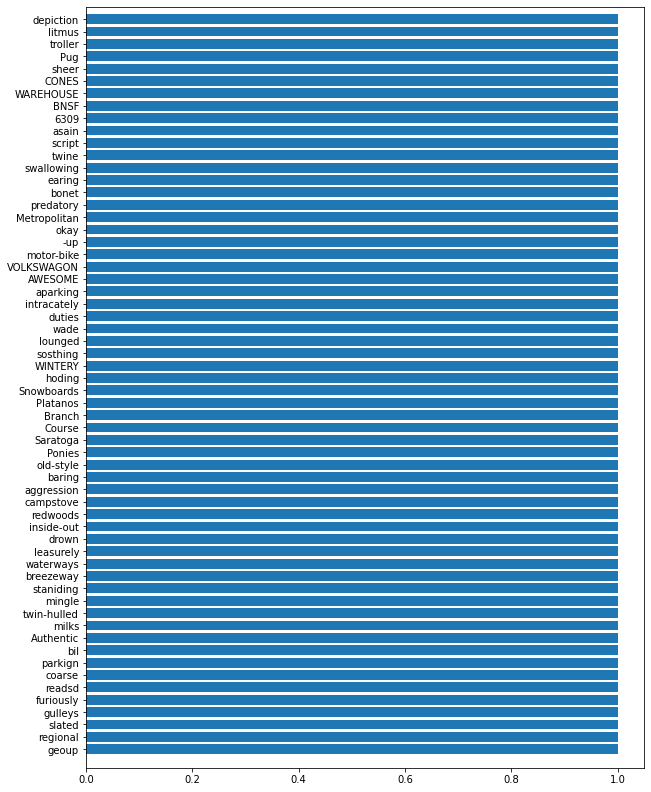

In [ ]:
size = 60
total = len(list(words_sorted.keys()))
fig, ax = plt.subplots(figsize=(10,14))
plt.barh(list(words_sorted.keys())[total-size:], list(words_sorted.values())[total-size:])
plt.ylim(len(list(words_sorted.values())[total-size:])+0.5, -1)
# plt.xticks(rotation=90)
# plt.yscale('log')
# plt.ylim(1e3, 2e5)
plt.show()

In [ ]:
import cv2

test_loader = DataLoader(testset, batch_size=1, collate_fn=collate_all)

words_test = {}

for batch, i in zip(test_loader, range(len(test_loader))):
        
    images, labels, tokens = batch
    # print(word_tokenize(labels[0][0]))
    for j in range(5):
      for k in range(len(word_tokenize(labels[0][j]))):
        if word_tokenize(labels[0][j])[k] not in words_test.keys():
          words_test[word_tokenize(labels[0][j])[k]] = 1
        elif word_tokenize(labels[0][j])[k] in words_test.keys():
          words_test[word_tokenize(labels[0][j])[k]] += 1

In [ ]:
words_test_sorted = {k: v for k, v in sorted(words_test.items(), key=lambda item: item[1])}
words_test_sorted = OrderedDict(reversed(list(words_test_sorted.items())))

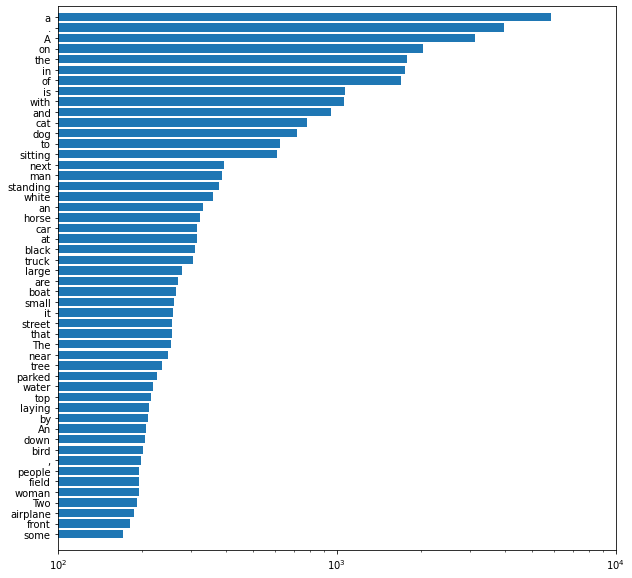

In [ ]:
size = 50
fig, ax = plt.subplots(figsize=(10,10))
plt.barh(list(words_test_sorted.keys())[:size], list(words_test_sorted.values())[:size])
plt.ylim(len(list(words_test_sorted.values())[:size])+0.5, -1)
# plt.yticks(rotation=90)
plt.xscale('log')
plt.xlim(1e2, 1e4)
plt.show()

In [ ]:
sum(words_sorted.values())

4678790

In [ ]:
sum(words_test_sorted.values())

59176

In [ ]:
ratio = {}

for key in tqdm(words_sorted.keys()):
  for second_key in words_test_sorted.keys():
    if key == second_key:
      ratio[key] = [words_sorted[key]/sum(words_sorted.values()),
                    words_test_sorted[second_key]/sum(words_test_sorted.values())]

100%|██████████| 31623/31623 [00:35<00:00, 881.54it/s] 


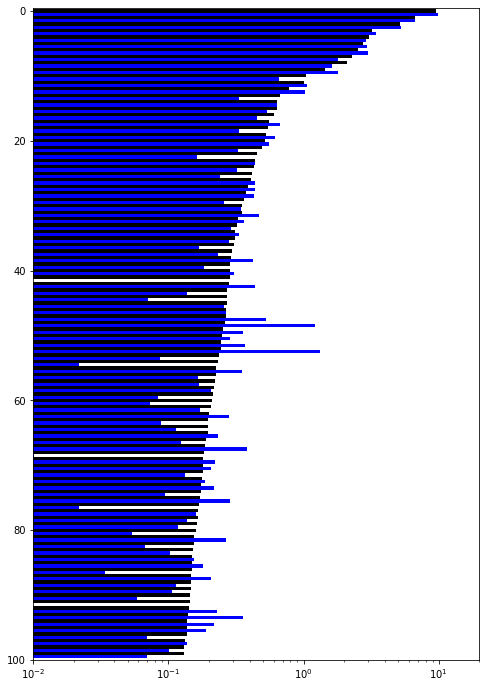

In [ ]:
fig, ax = plt.subplots(figsize=(8,12))
for i in range(100):
  plt.barh(i, 100*ratio[list(ratio.keys())[i]][0], color = 'black', height = 0.5)
  plt.barh(i+0.5, 100*ratio[list(ratio.keys())[i]][1], color = 'blue', height = 0.5)

plt.ylim(100, -0.5)
plt.xlim(1e-2, 2e1)
plt.xscale('log')

In [ ]:
fraction = 0
n = 40
for i in range(n):
  fraction += ratio[list(ratio.keys())[i]][0]

print(f'As {n} palavras mais frequentes aparecem compõe {fraction*100:.1f}% do total')

As 40 palavras mais frequentes aparecem compõe 53.0% do total


In [ ]:
keys_id = {}
for idx, key in enumerate(words_sorted.keys()):
  keys_id[key] = idx

for idx, key in enumerate(words_test_sorted.keys()):
  if list(words_test_sorted.keys())[idx] not in list(keys_id.keys()):
    keys_id[key] = len(list(keys_id.keys())) + idx

In [ ]:
dist_train = np.array([0])
dist_test = np.array([0])

for i in tqdm(range(len(list(words_sorted.keys())))):
  dist_train = np.concatenate((dist_train, np.array([keys_id[list(words_sorted.keys())[i]] for j in range(words_sorted[list(words_sorted.keys())[i]])])))

for i in tqdm(range(len(list(words_test_sorted.keys())))):
  dist_test = np.concatenate((dist_test, np.array([keys_id[list(words_test_sorted.keys())[i]] for j in range(words_test_sorted[list(words_test_sorted.keys())[i]])])))

100%|██████████| 3688/3688 [00:07<00:00, 496.11it/s] 


In [ ]:
import scipy.stats as st

ks, p = st.ks_2samp(dist_train, dist_test)
print(ks, p)

0.0251314337887919 1.7013762420077465e-32


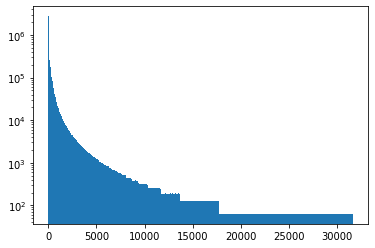

In [ ]:
plt.hist(dist_train, bins = 500)
plt.yscale('log')
plt.show()

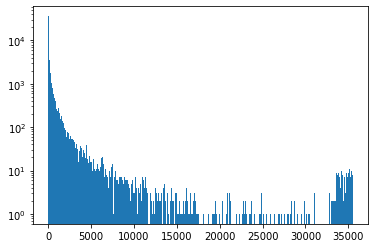

In [ ]:
plt.hist(dist_test, bins = 500)
plt.yscale('log')
plt.show()

In [ ]:
len(dist_test)

59177

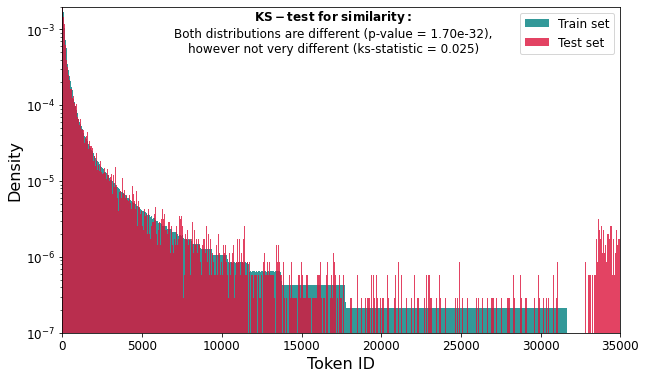

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
plt.hist(dist_train, bins = 600, density = True, alpha = 0.8, label = 'Train set', color = 'teal')
plt.hist(dist_test, bins = 600, density = True, alpha = 0.8, label = 'Test set', color = 'crimson')
plt.ylim(1e-7, 2e-3)
plt.xlim(0, 35000)
plt.yscale('log')
plt.legend(loc='upper right', fontsize = 12)
plt.xlabel('Token ID', fontsize = 16)
plt.ylabel('Density', fontsize = 16)
plt.text(17000, 5e-4, r'$\bf{KS-test}$ $\bf{for}$ $\bf{similarity:}$'
'\n'
f'Both distributions are different (p-value = {p:.2e}),'
'\n'
f'however not very different (ks-statistic = {ks:.3f})', ha = 'center', fontsize = 12)
plt.yticks(fontsize = 12)
plt.xticks(fontsize = 12)
plt.savefig('Token_distribution.svg', dpi = 300, bbox_inches = 'tight')
plt.savefig('Token_distribution.png', dpi = 300, bbox_inches = 'tight')
plt.show()

# Ideia extra

In [ ]:
model = model.eval()

model.visualize = True
torch.cuda.empty_cache()

# Fix da Gabriela para o decoder retornar cross-attentions.
# Pelo meu entendimento do código, popula uma variável global com as cross attentions
# sempre que acontece o forward. 
# https://github.com/huggingface/transformers/pull/7213
class LoggerModule(nn.Module):
    """
    Creates a wrapper module that calls a callback everytime the underlying
    layer is called. Also allows passing additional fixed kwargs to the layer.
    """
    
    def __init__(self, layer, callback, layer_kwargs=None):
        super().__init__()
        self.layer = layer
        self.layer_kwargs = layer_kwargs or {}
        
    def forward(self, *args, **kwargs):
        # Force provided kwargs. 
        kwargs.update(self.layer_kwargs)
        
        # Call inner layer.
        result = self.layer(*args, **kwargs)
        
        # Broadcast results using the callback.
        callback(result)        
        
        return result
        

attention_weights = []
        
    
def callback(result):
    global attention_weights
    probs = result[-1]
    attention_weights.append(probs)

# Monkey patch the last decoder block with the logging block.
model.t5.decoder.block[-1].layer[1].EncDecAttention = LoggerModule(
    last_cross_attention.EncDecAttention, 
    callback, 
    layer_kwargs={"output_attentions": True},
)

In [ ]:
from matplotlib import pyplot as plt
import cv2

test_loader = DataLoader(testset, batch_size=1, collate_fn=collate_all)

attention_weights = []

dl = iter(model.test_dataloader())

# Lets check the first item of 2 batches
for _ in range(10):
    batch = next(dl)
    imgs, caption = batch[0][:1], batch[2][:1]

    with torch.no_grad():
        tokens = model((imgs.cuda(), caption, caption))

    for img, cap, tokens in zip(imgs, caption, tokens):
        img = (img + 1)/2
        
        print(f"T: {cap}\nP: {model.tokenizer.decode(tokens)}")

        # Loop over tokens trying to show attention
        # inspired by Gabriela's implementation
        plt.figure(figsize=(20, 5))
        for i, token, weight in zip(range(len(tokens) - 2), tokens[1:-1], attention_weights):
            # getting weights from first head
            cross_attention = weight[0, 0, -1].cpu()  

            # 64 seq_len -> 8x8 "image"
            cross_attention = ((cross_attention - cross_attention.min())/ (cross_attention.max() - cross_attention.min())).view(8, 8).numpy()  

            cross_attention = cv2.resize(cross_attention, img.shape[1:], interpolation=cv2.INTER_CUBIC)
            
            plt.subplot(1, len(tokens) - 2, i + 1)
            plt.axis('off')
            plt.title(model.tokenizer.decode([token]))    
            plt.imshow(img.permute(1, 2, 0).cpu().numpy())
            plt.imshow(cross_attention, cmap='jet', alpha=0.3)
        
        plt.show()

    print('*'*20)

AttributeError: ignored

In [ ]:
import cv2

for img, tokens, weights in results[:1]:
    for head in range(8):

        f, axes = plt.subplots(1, len(weights) - 1, figsize=(50, 5))

        for token, weight, ax in zip(tokens.tolist()[1:-1], weights, range(len(weights))):
            weight = torch.cat(weight)  # shape (num_blocks, num_heads, num_tokens, d_model)
            max_heads = weight[-1, head, -1, :]
            max_heads = max_heads / max_heads.max()

            expanded_attention = cv2.resize(max_heads.view(16, 16).numpy(), dsize=(256, 256), interpolation=cv2.INTER_LINEAR)

            axes[ax].imshow(
                np.moveaxis(expanded_attention * img, 0, 2)
            )
            axes[ax].set_title(tokenizer.decode(token))
            axes[ax].axis(False)

        plt.show()